$\Huge \rm MDS7201$


$\Huge \rm Exploratory~ Data~ Analysis~ (EDA)$

Francisco Förster

# The problem

* What is the problem you want to solve?

* What are the KPIs? SMART vs FAST

![smart](smart.png)

![fast](FAST.jpg)

## Preliminary Analysis

* What data and how much data is available?

* Any missing values?

* Basic statistics

* What preprocessing is required? Can you scale the data to make it look normal?

* Can you add new sources of data?

* Can you visualize the data?

* Can you solve the problem just looking at the data?

## Detailed analysis

* Are the variables independent? If not, what are the correlations?

* Do you need to reduce the dimensionality of the data?

* Can you do unsupervised clustering?

* Is there a data imbalance problem? If so, can you fix it? (if supervised)

* If classification or regression, plot the variables divided by class or range of variable to predict.

* Do KS test to automatically identify the variables that are more relevant.

* Perform feature importance tests, e.g. training a random forest

# What should a good exploratory data analysis contain?

chatGPT4o: 

A good Exploratory Data Analysis (EDA) should provide a comprehensive understanding of the dataset, identify potential issues, and extract initial insights. Below are the key components of an effective EDA:

## Understanding the Data

- Dataset Overview: Brief description of the dataset, including its source, structure, and purpose.
- Column Descriptions: List of variables (features), their types (categorical, numerical, etc.), and meanings.
- Shape of Data: Number of rows and columns.

## Handling Missing Data

- Check for missing values in each column.
- Assess patterns of missingness (random, systematic, or correlated with other features).
- Decide on imputation strategies (mean, median, mode, interpolation, or removal of rows/columns).

## Handling Duplicates

- Identify and remove duplicate rows if they are redundant.

## Basic Descriptive Statistics

- Summary statistics for numerical variables (mean, median, variance, skewness, kurtosis, etc.).
- Summary of categorical variables (frequency counts, mode, unique values).

## Feature Distributions

- Histograms & KDE plots: Show how numerical variables are distributed.
- Boxplots: Identify outliers and spread of the data.
- Bar plots: Visualize categorical variable distributions.

## Outlier Detection

- Boxplots, Z-scores, or Interquartile Range (IQR) method.
- Impact assessment: Are outliers errors or meaningful?

## Feature Relationships and Correlations

- Pairwise scatter plots (pairplot): Identify relationships between numerical variables.
- Correlation matrix (heatmap): Identify collinear features.
- Categorical vs. numerical relationships: Boxplots, violin plots.
- Time-series trends (if applicable).

## Feature Engineering Insights

- Identify potential transformations (log, scaling, etc.).
- Suggest new features based on interactions or domain knowledge.
- Encoding strategies for categorical variables.

## Data Quality and Anomalies

- Check for inconsistencies, incorrect values, or unexpected patterns.
- Verify data types and potential formatting issues.

## Initial Hypothesis and Insights

- Based on the patterns observed, outline possible trends and relationships.
- Formulate hypotheses for further testing or modeling.

## Bonus: Automation & Reproducibility

- Use Jupyter Notebooks or Python scripts for reproducibility.
- Leverage EDA libraries like pandas-profiling, sweetviz, or dataprep.

# Example dataset

We will use some data from the ALeRCE broker. This consists of features obtained from time series in two different bands. Some features cannot be computed, so they have NaN values.

The focus of this class will be *tabular* data, note that images, time series, text all have different techniques associated.

Let's try some real data from the ALeRCE broker. This data contains features for different astronomical objects. The object name is `oid`, the feature name is `name`, the band used to derive the feature is `fid`, the value of the feature is `value`, and the version of the computed feature is `version`.

In [61]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

In [62]:
df = pd.read_pickle("data/features_small.pickle")

In [63]:
df

,name,value,fid,version
oid,,,,
ZTF17aaaabrg,Amplitude,0.242504,1,feature_0.0.1
ZTF17aaaabrg,Amplitude,0.232499,2,feature_0.0.1
ZTF17aaaabrg,AndersonDarling,1.000000,1,feature_0.0.1
ZTF17aaaabrg,AndersonDarling,1.000000,2,feature_0.0.1
ZTF17aaaabrg,Autocor_length,1.000000,1,feature_0.0.1
...,...,...,...,...
ZTF21abkylyc,Std,0.239856,2,feature_0.0.1
ZTF21abkylyc,StetsonK,NaN,1,feature_0.0.1
ZTF21abkylyc,StetsonK,0.886870,2,feature_0.0.1


Let's reset the index, create a new column with the name and fid, and pivot the data

In [64]:
df = df.reset_index()
df["fname"] = df.name + "_" + df.fid.astype(str)
df

,oid,name,value,fid,version,fname
0,ZTF17aaaabrg,Amplitude,0.242504,1,feature_0.0.1,Amplitude_1
1,ZTF17aaaabrg,Amplitude,0.232499,2,feature_0.0.1,Amplitude_2
2,ZTF17aaaabrg,AndersonDarling,1.000000,1,feature_0.0.1,AndersonDarling_1
3,ZTF17aaaabrg,AndersonDarling,1.000000,2,feature_0.0.1,AndersonDarling_2
4,ZTF17aaaabrg,Autocor_length,1.000000,1,feature_0.0.1,Autocor_length_1
...,...,...,...,...,...,...
6739895,ZTF21abkylyc,Std,0.239856,2,feature_0.0.1,Std_2
6739896,ZTF21abkylyc,StetsonK,NaN,1,feature_0.0.1,StetsonK_1
6739897,ZTF21abkylyc,StetsonK,0.886870,2,feature_0.0.1,StetsonK_2
6739898,ZTF21abkylyc,W1-W2,NaN,0,feature_0.0.1,W1-W2_0


Let's pivot the data to have one row per object


In [65]:
df = df.pivot(index="oid", columns=["fname"], values="value")
df.head()

fname,Amplitude_1,Amplitude_2,AndersonDarling_1,AndersonDarling_2,Autocor_length_1,Autocor_length_2,Beyond1Std_1,Beyond1Std_2,Con_1,Con_2,...,n_non_det_before_fid_1,n_non_det_before_fid_2,n_pos_1,n_pos_2,positive_fraction_1,positive_fraction_2,r-W2_0,r-W3_0,rb_0,sgscore1_0
oid,,,,,,,,,,,,,,,,,,,,,
ZTF17aaaabrg,0.242504,0.232499,1.0,1.000000,1.0,1.0,0.426471,0.361446,0.0,0.000000,...,0.0,0.0,18.0,29.0,0.264706,0.349398,NaN,NaN,0.891429,0.979470
ZTF17aaaabtj,0.294114,0.216206,1.0,1.000000,1.0,1.0,0.489510,0.390909,0.0,0.009259,...,0.0,1.0,54.0,11.0,0.377622,0.100000,NaN,NaN,0.864286,0.989226
ZTF17aaaacml,0.179008,0.162632,1.0,1.000000,1.0,1.0,0.403846,0.229508,0.0,0.000000,...,0.0,2.0,16.0,47.0,0.307692,0.770492,NaN,NaN,0.855714,0.998750
ZTF17aaaacnc,0.199403,0.215955,1.0,0.999978,1.0,1.0,0.062500,0.350000,0.0,0.000000,...,5.0,3.0,1.0,5.0,0.062500,0.125000,NaN,NaN,0.764286,0.997083
ZTF17aaaacnt,0.671062,0.498549,1.0,0.775576,1.0,1.0,0.242105,0.298246,0.0,0.000000,...,1.0,1.0,54.0,73.0,0.568421,0.640351,NaN,NaN,0.745714,0.995625


In [66]:
df

fname,Amplitude_1,Amplitude_2,AndersonDarling_1,AndersonDarling_2,Autocor_length_1,Autocor_length_2,Beyond1Std_1,Beyond1Std_2,Con_1,Con_2,...,n_non_det_before_fid_1,n_non_det_before_fid_2,n_pos_1,n_pos_2,positive_fraction_1,positive_fraction_2,r-W2_0,r-W3_0,rb_0,sgscore1_0
oid,,,,,,,,,,,,,,,,,,,,,
ZTF17aaaabrg,0.242504,0.232499,1.000000,1.000000,1.0,1.0,0.426471,0.361446,0.0,0.000000,...,0.0,0.0,18.0,29.0,0.264706,0.349398,NaN,NaN,0.891429,0.979470
ZTF17aaaabtj,0.294114,0.216206,1.000000,1.000000,1.0,1.0,0.489510,0.390909,0.0,0.009259,...,0.0,1.0,54.0,11.0,0.377622,0.100000,NaN,NaN,0.864286,0.989226
ZTF17aaaacml,0.179008,0.162632,1.000000,1.000000,1.0,1.0,0.403846,0.229508,0.0,0.000000,...,0.0,2.0,16.0,47.0,0.307692,0.770492,NaN,NaN,0.855714,0.998750
ZTF17aaaacnc,0.199403,0.215955,1.000000,0.999978,1.0,1.0,0.062500,0.350000,0.0,0.000000,...,5.0,3.0,1.0,5.0,0.062500,0.125000,NaN,NaN,0.764286,0.997083
ZTF17aaaacnt,0.671062,0.498549,1.000000,0.775576,1.0,1.0,0.242105,0.298246,0.0,0.000000,...,1.0,1.0,54.0,73.0,0.568421,0.640351,NaN,NaN,0.745714,0.995625
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZTF21abkjyui,0.683250,NaN,0.677959,NaN,1.0,NaN,0.333333,NaN,0.0,NaN,...,0.0,NaN,6.0,NaN,1.000000,NaN,NaN,NaN,0.725000,0.979375
ZTF21abkndcw,0.617332,NaN,0.989514,NaN,1.0,NaN,0.166667,NaN,0.0,NaN,...,0.0,0.0,1.0,5.0,0.166667,1.000000,1.479431,3.447430,0.827143,0.932292
ZTF21abknlix,0.077879,0.075038,0.520365,0.386736,3.0,1.0,0.416667,0.285714,0.0,0.000000,...,0.0,2.0,12.0,7.0,1.000000,1.000000,5.690223,5.896222,0.777143,1.000000


Now we have one row per object and one column per feature per band

# Automatic EDA (not recommended)

In [7]:
from ydata_profiling import ProfileReport

First, we do a minimal analysis for all the columns

In [8]:
profile = ProfileReport(df, minimal=True)
profile.to_file(output_file="output.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Then, we run a full analysis for the first 15 columns

In [9]:
profile = ProfileReport(df.iloc[:, :15])
profile.to_file(output_file="output_selection.html")

/home/fforster/anaconda3/lib/python3.8/site-packages/ydata_profiling/utils/dataframe.py:137: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.rename(columns={"index": "df_index"}, inplace=True)


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

# Preprocessing

## Data cleaning


* Missing data
* Noisy data
* Incorrect typing

### Missing data

Let's count the fraction of nan values

<Axes: ylabel='fname'>

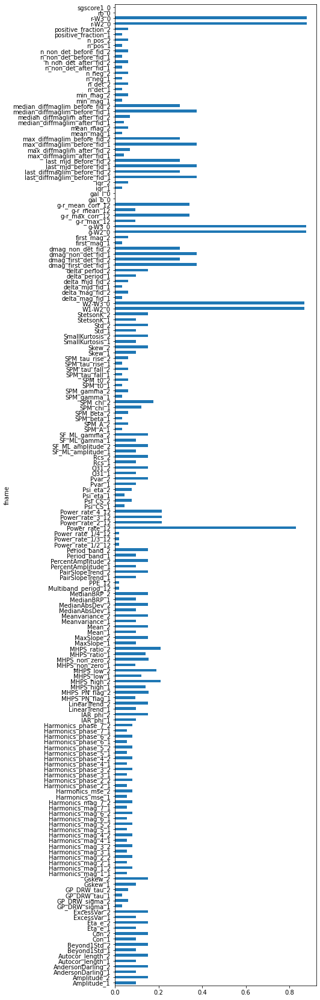

In [10]:
(df.isna().sum() / df.shape[0]).plot.barh(figsize=(6, 30))

/home/fforster/anaconda3/lib/python3.8/site-packages/pandas/plotting/_matplotlib/core.py:1114: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  scatter = ax.scatter(


<Axes: xlabel='Mean_1', ylabel='Mean_2'>

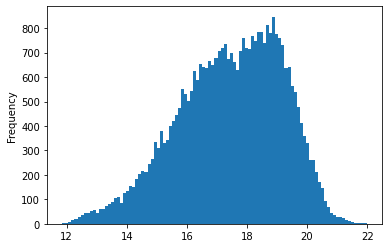

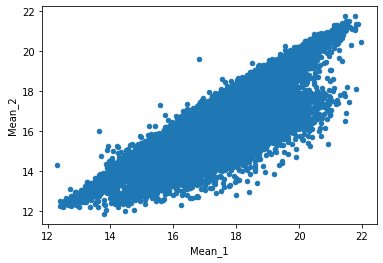

In [67]:
df.Mean_1.plot.hist(bins=100)
df.plot.scatter(x="Mean_1", y="Mean_2")

In [68]:
import datashader as ds
import holoviews as hv

from holoviews import opts
from holoviews.operation.datashader import datashade, rasterize, shade, dynspread, spread
from holoviews.operation.resample import ResampleOperation2D
from holoviews.operation import decimate

from matplotlib import colormaps as cmap

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
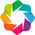

In [69]:
hv.extension('bokeh','matplotlib', width=80)

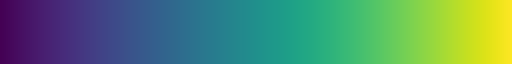

In [70]:
cmap["viridis"]

In [71]:
points = datashade(hv.Points(df[["Mean_1", "Mean_2"]], label="Points"), cmap=cmap["viridis"])
points

:DynamicMap   []
   :RGB   [Mean_1,Mean_2]   (R,G,B,A)

### Imputation

Replace by arbitrary value

In [72]:
aux = df.fillna(-99)
aux

fname,Amplitude_1,Amplitude_2,AndersonDarling_1,AndersonDarling_2,Autocor_length_1,Autocor_length_2,Beyond1Std_1,Beyond1Std_2,Con_1,Con_2,...,n_non_det_before_fid_1,n_non_det_before_fid_2,n_pos_1,n_pos_2,positive_fraction_1,positive_fraction_2,r-W2_0,r-W3_0,rb_0,sgscore1_0
oid,,,,,,,,,,,,,,,,,,,,,
ZTF17aaaabrg,0.242504,0.232499,1.000000,1.000000,1.0,1.0,0.426471,0.361446,0.0,0.000000,...,0.0,0.0,18.0,29.0,0.264706,0.349398,-99.000000,-99.000000,0.891429,0.979470
ZTF17aaaabtj,0.294114,0.216206,1.000000,1.000000,1.0,1.0,0.489510,0.390909,0.0,0.009259,...,0.0,1.0,54.0,11.0,0.377622,0.100000,-99.000000,-99.000000,0.864286,0.989226
ZTF17aaaacml,0.179008,0.162632,1.000000,1.000000,1.0,1.0,0.403846,0.229508,0.0,0.000000,...,0.0,2.0,16.0,47.0,0.307692,0.770492,-99.000000,-99.000000,0.855714,0.998750
ZTF17aaaacnc,0.199403,0.215955,1.000000,0.999978,1.0,1.0,0.062500,0.350000,0.0,0.000000,...,5.0,3.0,1.0,5.0,0.062500,0.125000,-99.000000,-99.000000,0.764286,0.997083
ZTF17aaaacnt,0.671062,0.498549,1.000000,0.775576,1.0,1.0,0.242105,0.298246,0.0,0.000000,...,1.0,1.0,54.0,73.0,0.568421,0.640351,-99.000000,-99.000000,0.745714,0.995625
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZTF21abkjyui,0.683250,-99.000000,0.677959,-99.000000,1.0,-99.0,0.333333,-99.000000,0.0,-99.000000,...,0.0,-99.0,6.0,-99.0,1.000000,-99.000000,-99.000000,-99.000000,0.725000,0.979375
ZTF21abkndcw,0.617332,-99.000000,0.989514,-99.000000,1.0,-99.0,0.166667,-99.000000,0.0,-99.000000,...,0.0,0.0,1.0,5.0,0.166667,1.000000,1.479431,3.447430,0.827143,0.932292
ZTF21abknlix,0.077879,0.075038,0.520365,0.386736,3.0,1.0,0.416667,0.285714,0.0,0.000000,...,0.0,2.0,12.0,7.0,1.000000,1.000000,5.690223,5.896222,0.777143,1.000000


/home/fforster/anaconda3/lib/python3.8/site-packages/pandas/plotting/_matplotlib/core.py:1114: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  scatter = ax.scatter(


<Axes: xlabel='Mean_1', ylabel='Mean_2'>

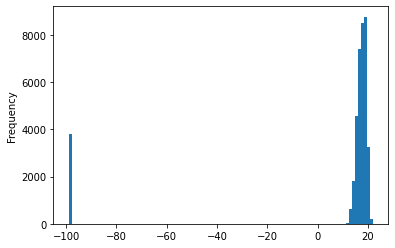

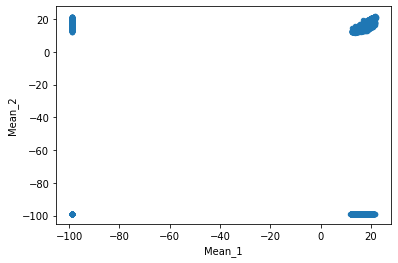

In [73]:
aux.Mean_1.plot.hist(bins=100)
aux.plot.scatter(x="Mean_1", y="Mean_2")

In [18]:
points = datashade(hv.Points(aux[["Mean_1", "Mean_2"]], label="Points"), cmap=cmap["viridis"])
points

:DynamicMap   []
   :RGB   [Mean_1,Mean_2]   (R,G,B,A)

Replace by the median value

In [74]:
aux = df.fillna(df.median())

/home/fforster/anaconda3/lib/python3.8/site-packages/pandas/plotting/_matplotlib/core.py:1114: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  scatter = ax.scatter(


<Axes: xlabel='Mean_1', ylabel='Mean_2'>

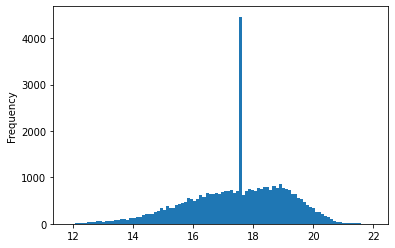

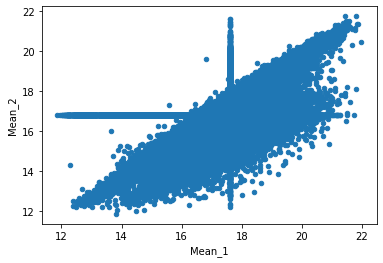

In [75]:
aux.Mean_1.plot.hist(bins=100)
aux.plot.scatter(x="Mean_1", y="Mean_2")

In [21]:
points = datashade(hv.Points(aux[["Mean_1", "Mean_2"]], label="Points"), cmap=cmap["viridis"])
points

:DynamicMap   []
   :RGB   [Mean_1,Mean_2]   (R,G,B,A)

Replace with data sampled from the same dimension

In [76]:
df.Amplitude_1.fillna(pd.Series(index=df[df.Amplitude_1.isna()].index, 
                                data=df.Amplitude_1.dropna().sample(df.Amplitude_1.isna().sum(), replace=True).values))

oid
ZTF17aaaabrg    0.242504
ZTF17aaaabtj    0.294114
ZTF17aaaacml    0.179008
ZTF17aaaacnc    0.199403
ZTF17aaaacnt    0.671062
                  ...   
ZTF21abkjyui    0.683250
ZTF21abkndcw    0.617332
ZTF21abknlix    0.077879
ZTF21abkrimu    1.836279
ZTF21abkylyc    0.066947
Name: Amplitude_1, Length: 39024, dtype: float64

Let's do it column by column

In [77]:
for col in list(df):
    df[col] = df[col].fillna(pd.Series(index=df[df[col].isna()].index, 
                                data=df[col].dropna().sample(df[col].isna().sum(), replace=True).values))

/home/fforster/anaconda3/lib/python3.8/site-packages/pandas/plotting/_matplotlib/core.py:1114: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  scatter = ax.scatter(


<Axes: xlabel='Mean_1', ylabel='Mean_2'>

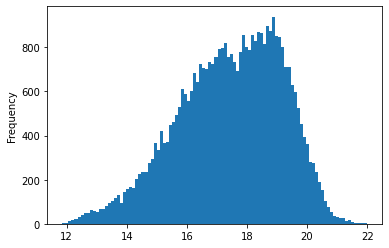

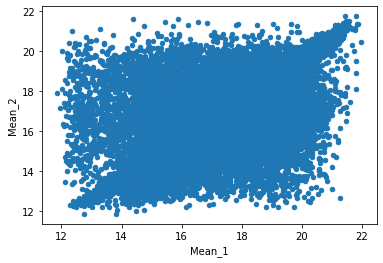

In [24]:
df.Mean_1.plot.hist(bins=100)
df.plot.scatter(x="Mean_1", y="Mean_2")

In [25]:
df

fname,Amplitude_1,Amplitude_2,AndersonDarling_1,AndersonDarling_2,Autocor_length_1,Autocor_length_2,Beyond1Std_1,Beyond1Std_2,Con_1,Con_2,...,n_non_det_before_fid_1,n_non_det_before_fid_2,n_pos_1,n_pos_2,positive_fraction_1,positive_fraction_2,r-W2_0,r-W3_0,rb_0,sgscore1_0
oid,,,,,,,,,,,,,,,,,,,,,
ZTF17aaaabrg,0.242504,0.232499,1.000000,1.000000,1.0,1.0,0.426471,0.361446,0.0,0.000000,...,0.0,0.0,18.0,29.0,0.264706,0.349398,4.005602,7.887621,0.891429,0.979470
ZTF17aaaabtj,0.294114,0.216206,1.000000,1.000000,1.0,1.0,0.489510,0.390909,0.0,0.009259,...,0.0,1.0,54.0,11.0,0.377622,0.100000,3.091649,2.672783,0.864286,0.989226
ZTF17aaaacml,0.179008,0.162632,1.000000,1.000000,1.0,1.0,0.403846,0.229508,0.0,0.000000,...,0.0,2.0,16.0,47.0,0.307692,0.770492,5.465452,7.436777,0.855714,0.998750
ZTF17aaaacnc,0.199403,0.215955,1.000000,0.999978,1.0,1.0,0.062500,0.350000,0.0,0.000000,...,5.0,3.0,1.0,5.0,0.062500,0.125000,2.739660,7.185629,0.764286,0.997083
ZTF17aaaacnt,0.671062,0.498549,1.000000,0.775576,1.0,1.0,0.242105,0.298246,0.0,0.000000,...,1.0,1.0,54.0,73.0,0.568421,0.640351,0.949887,8.439452,0.745714,0.995625
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZTF21abkjyui,0.683250,0.350188,0.677959,0.365228,1.0,8.0,0.333333,0.225806,0.0,0.000000,...,0.0,13.0,6.0,0.0,1.000000,0.342105,3.099446,8.437933,0.725000,0.979375
ZTF21abkndcw,0.617332,0.471443,0.989514,0.211173,1.0,1.0,0.166667,0.405405,0.0,0.000000,...,0.0,0.0,1.0,5.0,0.166667,1.000000,1.479431,3.447430,0.827143,0.932292
ZTF21abknlix,0.077879,0.075038,0.520365,0.386736,3.0,1.0,0.416667,0.285714,0.0,0.000000,...,0.0,2.0,12.0,7.0,1.000000,1.000000,5.690223,5.896222,0.777143,1.000000


In [26]:
points = datashade(hv.Points(df[["Mean_1", "Mean_2"]], label="Points"), cmap=cmap["viridis"])
points

:DynamicMap   []
   :RGB   [Mean_1,Mean_2]   (R,G,B,A)

Let's go back to the original data again

In [78]:
df = pd.read_pickle("data/features_small.pickle")
df = df.reset_index()
df["fname"] = df.name + "_" + df.fid.astype(str)
df = df.pivot(index="oid", columns=["fname"], values="value")
df

fname,Amplitude_1,Amplitude_2,AndersonDarling_1,AndersonDarling_2,Autocor_length_1,Autocor_length_2,Beyond1Std_1,Beyond1Std_2,Con_1,Con_2,...,n_non_det_before_fid_1,n_non_det_before_fid_2,n_pos_1,n_pos_2,positive_fraction_1,positive_fraction_2,r-W2_0,r-W3_0,rb_0,sgscore1_0
oid,,,,,,,,,,,,,,,,,,,,,
ZTF17aaaabrg,0.242504,0.232499,1.000000,1.000000,1.0,1.0,0.426471,0.361446,0.0,0.000000,...,0.0,0.0,18.0,29.0,0.264706,0.349398,NaN,NaN,0.891429,0.979470
ZTF17aaaabtj,0.294114,0.216206,1.000000,1.000000,1.0,1.0,0.489510,0.390909,0.0,0.009259,...,0.0,1.0,54.0,11.0,0.377622,0.100000,NaN,NaN,0.864286,0.989226
ZTF17aaaacml,0.179008,0.162632,1.000000,1.000000,1.0,1.0,0.403846,0.229508,0.0,0.000000,...,0.0,2.0,16.0,47.0,0.307692,0.770492,NaN,NaN,0.855714,0.998750
ZTF17aaaacnc,0.199403,0.215955,1.000000,0.999978,1.0,1.0,0.062500,0.350000,0.0,0.000000,...,5.0,3.0,1.0,5.0,0.062500,0.125000,NaN,NaN,0.764286,0.997083
ZTF17aaaacnt,0.671062,0.498549,1.000000,0.775576,1.0,1.0,0.242105,0.298246,0.0,0.000000,...,1.0,1.0,54.0,73.0,0.568421,0.640351,NaN,NaN,0.745714,0.995625
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZTF21abkjyui,0.683250,NaN,0.677959,NaN,1.0,NaN,0.333333,NaN,0.0,NaN,...,0.0,NaN,6.0,NaN,1.000000,NaN,NaN,NaN,0.725000,0.979375
ZTF21abkndcw,0.617332,NaN,0.989514,NaN,1.0,NaN,0.166667,NaN,0.0,NaN,...,0.0,0.0,1.0,5.0,0.166667,1.000000,1.479431,3.447430,0.827143,0.932292
ZTF21abknlix,0.077879,0.075038,0.520365,0.386736,3.0,1.0,0.416667,0.285714,0.0,0.000000,...,0.0,2.0,12.0,7.0,1.000000,1.000000,5.690223,5.896222,0.777143,1.000000


Let's try scikit learn Simple Imputer instead.
See https://scikit-learn.org/stable/modules/generated/sklearn.impute.SimpleImputer.html#sklearn.impute.SimpleImputer

In [28]:
from sklearn.impute import SimpleImputer

Use the simple imputer to replace by the mean

In [79]:
imp = SimpleImputer(missing_values=np.nan, strategy='mean')
imp.fit(df)
aux = pd.DataFrame(index=df.index, data=imp.transform(df), columns=list(df))

/home/fforster/anaconda3/lib/python3.8/site-packages/pandas/plotting/_matplotlib/core.py:1114: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  scatter = ax.scatter(


<Axes: xlabel='Mean_1', ylabel='Mean_2'>

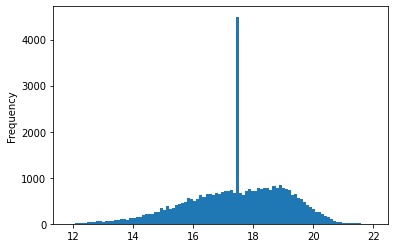

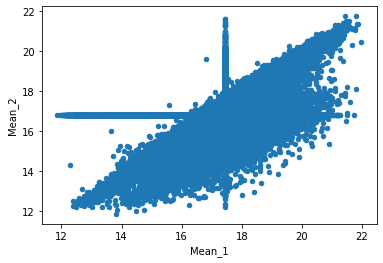

In [80]:
aux.Mean_1.plot.hist(bins=100)
aux.plot.scatter(x="Mean_1", y="Mean_2")

In [81]:
points = datashade(hv.Points(aux[["Mean_1", "Mean_2"]], label="Points"), cmap=cmap["viridis"])
points

:DynamicMap   []
   :RGB   [Mean_1,Mean_2]   (R,G,B,A)

Replace by the most frequent value

In [82]:
imp = SimpleImputer(missing_values=np.nan, strategy='most_frequent')
imp.fit(df)
aux = pd.DataFrame(index=df.index, data=imp.transform(df), columns=list(df))

/home/fforster/anaconda3/lib/python3.8/site-packages/pandas/plotting/_matplotlib/core.py:1114: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  scatter = ax.scatter(


<Axes: xlabel='Mean_1', ylabel='Mean_2'>

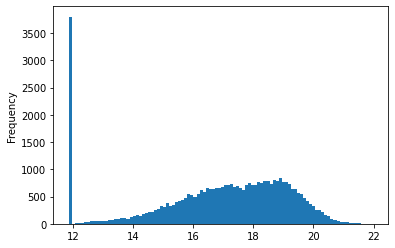

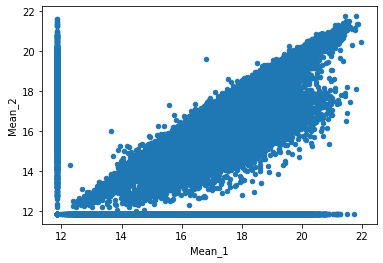

In [83]:
aux.Mean_1.plot.hist(bins=100)
aux.plot.scatter(x="Mean_1", y="Mean_2")

In [34]:
points = datashade(hv.Points(aux[["Mean_1", "Mean_2"]], label="Points"), cmap=cmap["viridis"])
points

:DynamicMap   []
   :RGB   [Mean_1,Mean_2]   (R,G,B,A)

Imputation based on feature correlations (slow)

In [36]:
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
imp = IterativeImputer(max_iter=10, random_state=0)
imp.fit(df)

IterativeImputer(random_state=0)

In [37]:
aux = pd.DataFrame(index=df.index, data=imp.transform(df), columns=list(df))
aux.to_pickle("features_impnan_1.pickle")

In [84]:
aux = pd.read_pickle("features_impnan_1.pickle")

/home/fforster/anaconda3/lib/python3.8/site-packages/pandas/plotting/_matplotlib/core.py:1114: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  scatter = ax.scatter(


<Axes: xlabel='Mean_1', ylabel='Mean_2'>

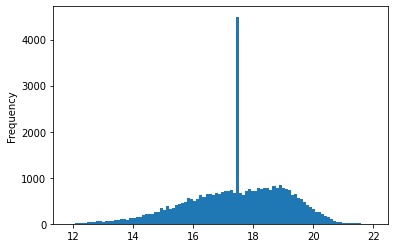

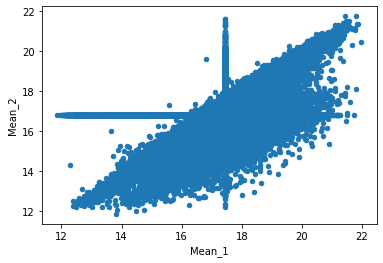

In [85]:
aux.Mean_1.plot.hist(bins=100)
aux.plot.scatter(x="Mean_1", y="Mean_2")

In [40]:
points = datashade(hv.Points(aux[["Mean_1", "Mean_2"]], label="Points"), cmap=cmap["viridis"])
points

:DynamicMap   []
   :RGB   [Mean_1,Mean_2]   (R,G,B,A)

In [41]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(df)
df_scaled = scaler.transform(df)

In [42]:
# 16 min!!
imp.fit(df_scaled)

KeyboardInterrupt: 

In [ ]:
aux = pd.DataFrame(index=df.index, data=imp.transform(df_scaled), columns=list(df))
aux.to_pickle("features_impnan_2.pickle")

In [43]:
aux = pd.read_pickle("features_impnan_2.pickle")

/home/fforster/anaconda3/lib/python3.8/site-packages/pandas/plotting/_matplotlib/core.py:1114: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  scatter = ax.scatter(


<Axes: xlabel='Mean_1', ylabel='Mean_2'>

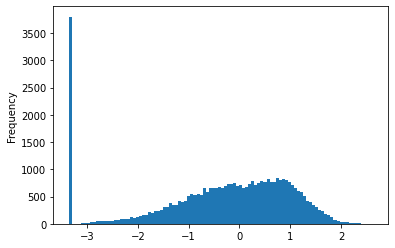

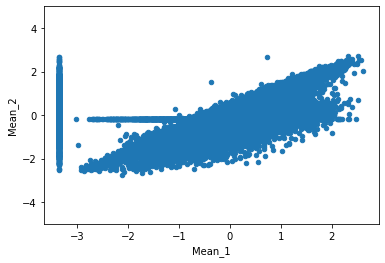

In [44]:
aux.Mean_1.plot.hist(bins=100)
aux.plot.scatter(x="Mean_1", y="Mean_2", ylim=(-5, 5))

In [ ]:
points = datashade(hv.Points(aux[["Mean_1", "Mean_2"]], label="Points"), cmap=cmap["viridis"])
points.options(ylim=(-10, 10))

In [ ]:
# 12 min!!

In [48]:
from sklearn.impute import KNNImputer
imputer = KNNImputer(n_neighbors=2, weights="uniform")
imputer.fit(df_scaled)
aux = pd.DataFrame(index=df.index, data=imputer.transform(df_scaled), columns=list(df))

In [51]:
aux = pd.DataFrame(index=df.index, data=scaler.inverse_transform(aux), columns=list(df))

In [52]:
aux

,Amplitude_1,Amplitude_2,AndersonDarling_1,AndersonDarling_2,Autocor_length_1,Autocor_length_2,Beyond1Std_1,Beyond1Std_2,Con_1,Con_2,...,n_non_det_before_fid_1,n_non_det_before_fid_2,n_pos_1,n_pos_2,positive_fraction_1,positive_fraction_2,r-W2_0,r-W3_0,rb_0,sgscore1_0
oid,,,,,,,,,,,,,,,,,,,,,
ZTF17aaaabrg,0.633514,0.555879,1.100872,1.097996,6.552405,6.435792,0.375941,0.360438,0.002198,0.002108,...,5.044141,6.861983,730.833441,1101.011200,0.564554,0.596495,7.136796,13.810024,0.892248,1.103152
ZTF17aaaabtj,0.657803,0.548981,1.100872,1.097996,6.552405,6.435792,0.382482,0.363351,0.002198,0.002195,...,5.044141,19.366649,2136.914679,432.837587,0.604847,0.505166,7.812796,12.810104,0.889935,1.105429
ZTF17aaaacml,0.603630,0.526296,1.100872,1.097996,6.552405,6.435792,0.373594,0.347394,0.002198,0.002108,...,5.044141,31.871314,652.717816,1769.184813,0.579893,0.750700,7.775386,15.747739,0.889204,1.107653
ZTF17aaaacnc,0.613229,0.548874,1.100872,1.097992,6.552405,6.435792,0.338178,0.359306,0.002198,0.002108,...,69.291724,44.375979,66.850634,210.113050,0.492399,0.514321,25.793571,34.653578,0.881413,1.107264
ZTF17aaaacnt,0.835209,0.668531,1.100872,1.048814,6.552405,6.435792,0.356813,0.354190,0.002198,0.002108,...,17.893658,19.366649,2136.914679,2734.324477,0.672931,0.703042,13.029211,17.381322,0.879830,1.106924
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZTF21abkjyui,0.840945,0.543763,1.032142,1.097996,6.552405,8.364402,0.366278,0.353833,0.002198,0.002108,...,5.044141,75.637642,262.139695,618.441369,0.826935,0.602601,8.998572,14.297159,0.878064,1.103129
ZTF21abkndcw,0.809922,0.547351,1.098634,1.087514,6.552405,10.293011,0.348986,0.351068,0.002198,0.002108,...,5.044141,6.861983,66.850634,210.113050,0.529570,0.834746,7.764956,15.124700,0.886769,1.092136
ZTF21abknlix,0.556035,0.489206,0.998508,0.963601,14.290816,6.435792,0.374924,0.352951,0.002198,0.002108,...,5.044141,31.871314,496.486568,284.354562,0.826935,0.834746,16.872423,21.171295,0.882508,1.107945


In [53]:
aux.to_pickle("features_impnan.pickle")

In [54]:
aux = pd.read_pickle("features_impnan.pickle")

/home/fforster/anaconda3/lib/python3.8/site-packages/pandas/plotting/_matplotlib/core.py:1114: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  scatter = ax.scatter(


<Axes: xlabel='Mean_1', ylabel='Mean_2'>

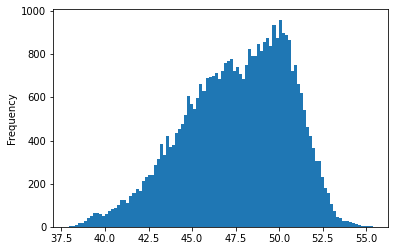

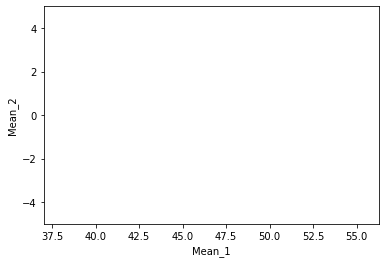

In [55]:
aux.Mean_1.plot.hist(bins=100)
aux.plot.scatter(x="Mean_1", y="Mean_2", ylim=(-5, 5))

In [56]:
points = datashade(hv.Points(aux[["Mean_1", "Mean_2"]], label="Points"), cmap=cmap["viridis"])
points

:DynamicMap   []
   :RGB   [Mean_1,Mean_2]   (R,G,B,A)

# Some basic statistics

Now we will run some basic statistics over all the columns and will plot them

In [86]:
dfstats = df.describe()
dfstats

fname,Amplitude_1,Amplitude_2,AndersonDarling_1,AndersonDarling_2,Autocor_length_1,Autocor_length_2,Beyond1Std_1,Beyond1Std_2,Con_1,Con_2,...,n_non_det_before_fid_1,n_non_det_before_fid_2,n_pos_1,n_pos_2,positive_fraction_1,positive_fraction_2,r-W2_0,r-W3_0,rb_0,sgscore1_0
count,35224.000000,33116.000000,35224.000000,33116.000000,35224.000000,33116.000000,35224.000000,33116.000000,35224.000000,33116.000000,...,37697.000000,36684.000000,37697.000000,36684.000000,37697.000000,36684.000000,4743.000000,4741.000000,39024.000000,39024.000000
mean,0.519382,0.457433,0.887452,0.878849,2.683199,2.578572,0.331694,0.324704,0.002198,0.002108,...,5.044141,6.861983,27.792822,24.509268,0.470097,0.468546,4.565115,6.612253,0.816277,0.874455
std,0.470644,0.423432,0.213424,0.219151,3.869261,3.857278,0.103755,0.098864,0.009523,0.009321,...,12.849687,12.504836,39.058330,37.121262,0.356843,0.366204,2.163115,2.469476,0.085225,0.233493
min,0.006390,0.006185,0.108049,0.101729,1.000000,1.000000,0.000000,0.021277,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.193442,0.429442,0.561429,0.000000
25%,0.187934,0.169923,0.898855,0.871091,1.000000,1.000000,0.264286,0.260870,0.000000,0.000000,...,0.000000,0.000000,3.000000,2.000000,0.142857,0.105263,3.331210,4.559600,0.752857,0.919264
50%,0.402083,0.341036,0.999934,0.999747,1.000000,1.000000,0.329268,0.325000,0.000000,0.000000,...,1.000000,3.000000,14.000000,12.000000,0.437500,0.441860,4.645677,7.501856,0.826905,0.988125
75%,0.687939,0.596356,1.000000,1.000000,3.000000,2.000000,0.400000,0.388889,0.000000,0.000000,...,5.000000,8.000000,37.000000,32.000000,0.785714,0.810181,5.516016,8.176749,0.889286,0.998000
max,3.920869,3.667311,1.000000,1.000000,98.000000,66.000000,0.738318,0.770833,0.127273,0.130435,...,414.000000,357.000000,651.000000,642.000000,1.000000,1.000000,15.322982,15.676599,0.977143,1.000000


# Data normality

Now the objective is to make the data as normal as possible by applying transformations.

The reason to do this is that many methods assume Gaussianity in their derivation, so let's try to make the data look as normal as possible.

Let's start by doing a box plot of all the variables

In [87]:
df = aux

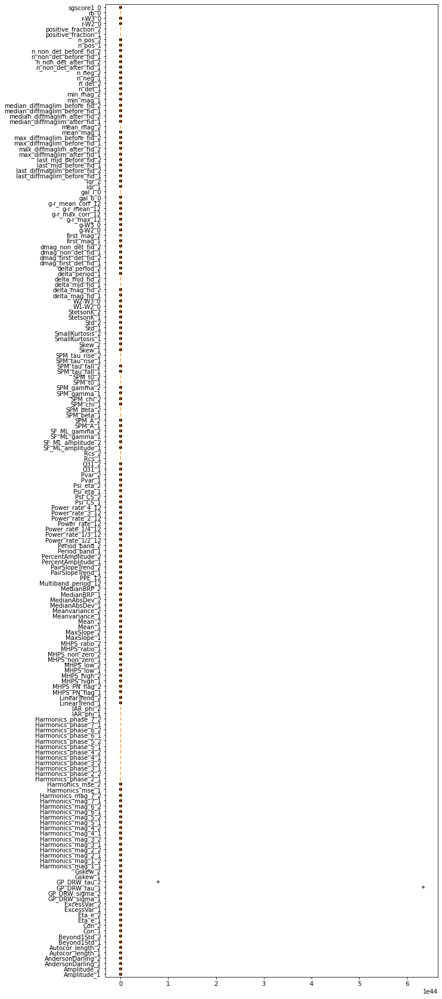

In [88]:
fig, ax = plt.subplots(figsize=(10, 30))
ax.boxplot(df, vert=False, labels=list(df), flierprops={'marker':'.'});

We don't see much, let's use the asinh scaling to see both small and large values, positive or negative.

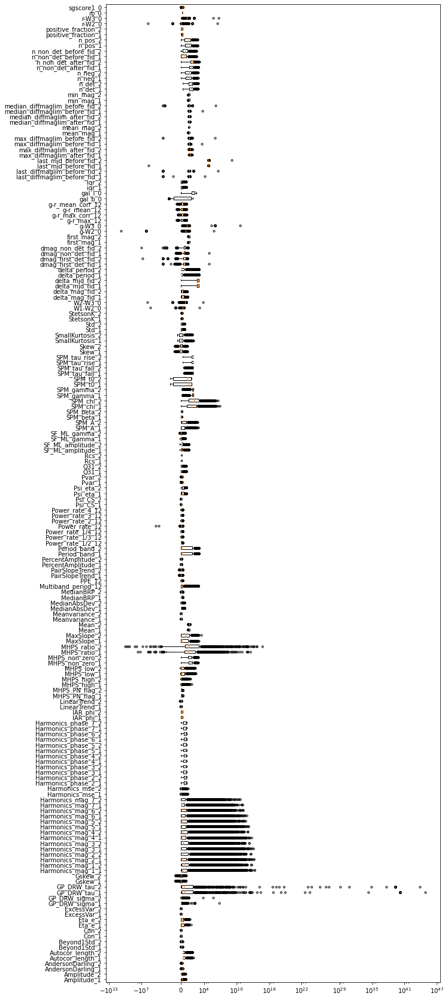

In [89]:
fig, ax = plt.subplots(figsize=(10, 30))
ax.boxplot(df, vert=False, labels=list(df), flierprops={'marker':'.'});
ax.set_xscale('asinh', linthresh=0.1)

We can see that the boxplots are full of outliers, this means that the data is far from normal.

In fact, some variables need to be plotted in log-log to really understand their distribution


<Axes: ylabel='Frequency'>

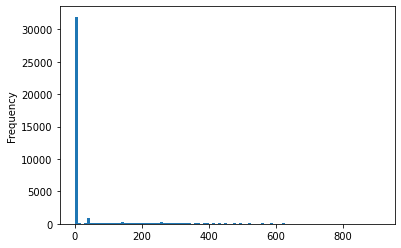

In [90]:
aux.Multiband_period_12.plot.hist(bins=100)

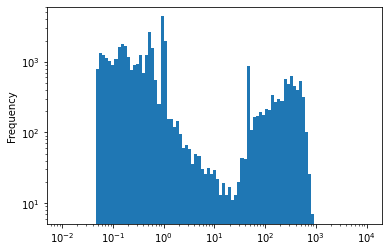

In [91]:
df.Multiband_period_12.plot.hist(log=True, bins=np.logspace(-2, 4, 100))
plt.xscale('log')

Let's try scaling the data first

In [92]:
from sklearn.preprocessing import RobustScaler, QuantileTransformer, StandardScaler

In [93]:
df = aux

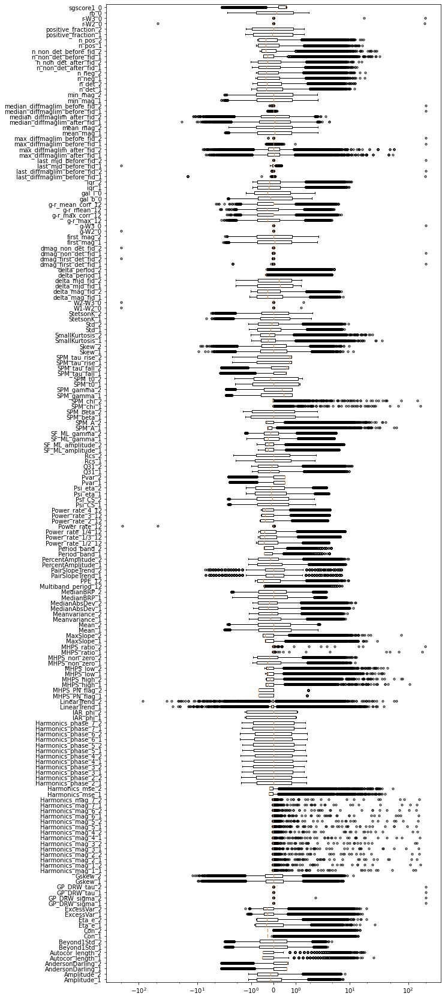

In [94]:
scaler = StandardScaler().fit(df)
dft = pd.DataFrame(data=scaler.transform(df), index=df.index, columns=list(df))
fig, ax = plt.subplots(figsize=(10, 30))
ax.boxplot(dft.dropna(), vert=False, labels=list(df), flierprops={'marker':'.'})
ax.set_xscale('asinh', linthresh=0.1)

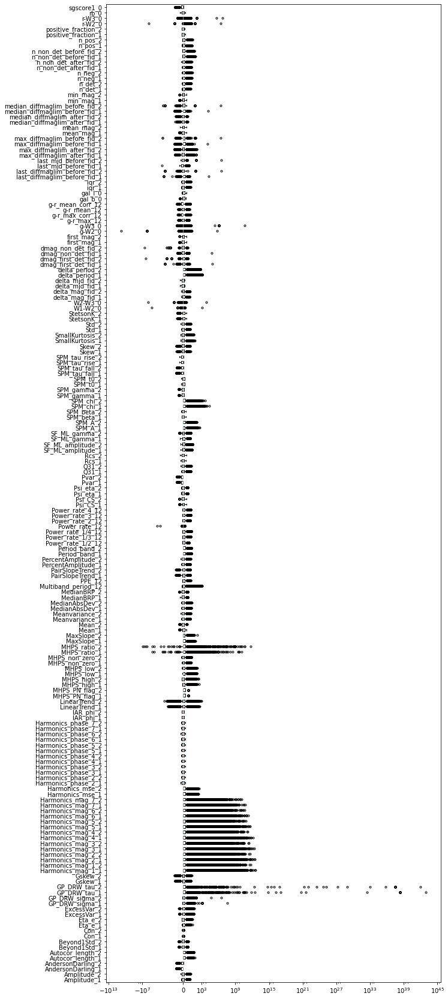

In [95]:
scaler_r = RobustScaler().fit(df)
dftr = pd.DataFrame(data=scaler_r.transform(df), index=df.index, columns=list(df))
fig, ax = plt.subplots(figsize=(10, 30))
ax.boxplot(dftr.dropna(), vert=False, labels=list(df), flierprops={'marker':'.'})
ax.set_xscale('asinh', linthresh=0.1)

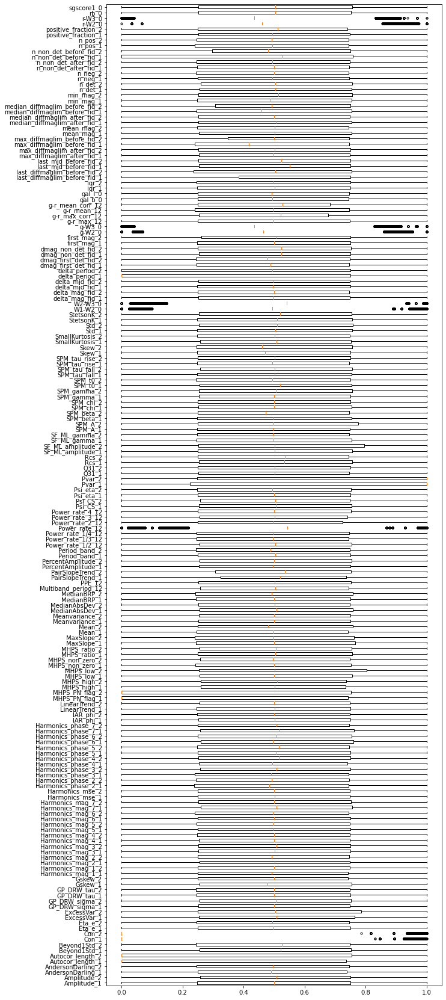

In [96]:
scaler_q = QuantileTransformer().fit(df)
dftq = pd.DataFrame(data=scaler_q.transform(df), index=df.index, columns=list(df))
fig, ax = plt.subplots(figsize=(10, 30))
ax.boxplot(dftq.dropna(), vert=False, labels=list(df), flierprops={'marker':'.'});
#ax.set_xscale('asinh', linthresh=0.1)

Now we will focus on the data normality

In [97]:
from scipy import stats

We will use the Shapiro-Wilk normality test (https://en.wikipedia.org/wiki/Shapiro%E2%80%93Wilk_test). We will use  a sample of 500 rows to focus on those columns where the effect is stronger.

<Axes: ylabel='Frequency'>

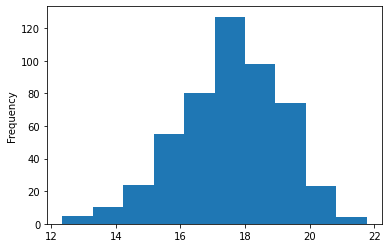

In [100]:
df.Mean_1.dropna().sample(500).plot.hist()

In [104]:
stats.shapiro(df.Skew_1.dropna().sample(500))

ShapiroResult(statistic=0.9604517221450806, pvalue=2.466031823189496e-10)

The p-value indicates a strong deviation from normality

Let's do this for all the columns

In [103]:
stats.shapiro(dft.Skew_1.dropna())

/home/fforster/anaconda3/lib/python3.8/site-packages/scipy/stats/_morestats.py:1816: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


ShapiroResult(statistic=0.9645993113517761, pvalue=0.0)

<Axes: >

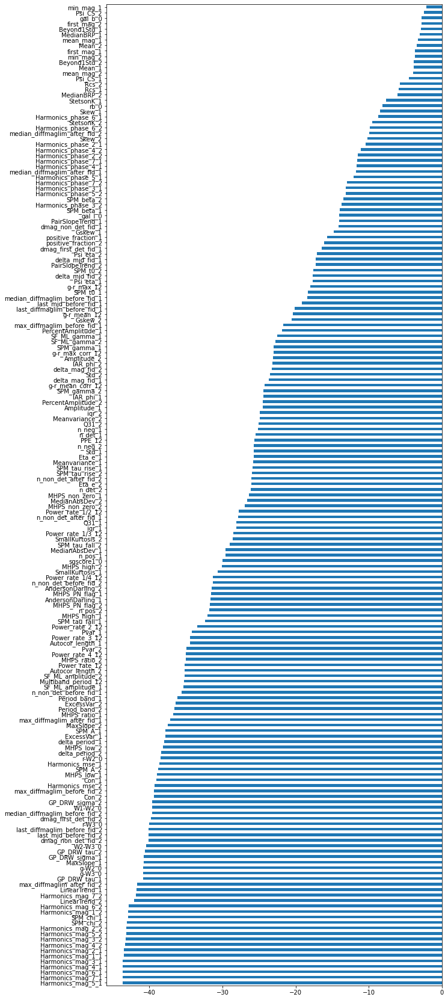

In [105]:
SW = dft.sample(500).apply(lambda col: np.log10(stats.shapiro(col.dropna()).pvalue), axis=0)
SW.sort_values().plot.barh(figsize=(10, 30))
#plt.xscale('log')

In [181]:
SW.sort_values()

MHPS_ratio_1        -43.707341
Harmonics_mag_7_1   -43.707341
Harmonics_mag_6_1   -43.677378
Harmonics_mag_1_1   -43.677378
Harmonics_mag_7_2   -43.677378
                       ...    
first_mag_1          -4.915326
first_mag_2          -4.391269
min_mag_1            -3.786390
GP_DRW_tau_2          0.000000
GP_DRW_tau_1          0.000000
Length: 179, dtype: float64

<Axes: ylabel='Frequency'>

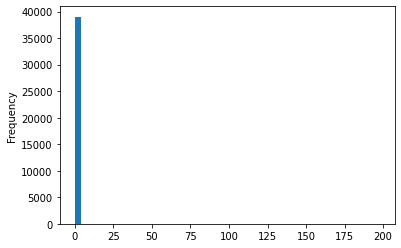

In [182]:
dft.GP_DRW_tau_1.plot.hist(bins=50)

<Axes: ylabel='Frequency'>

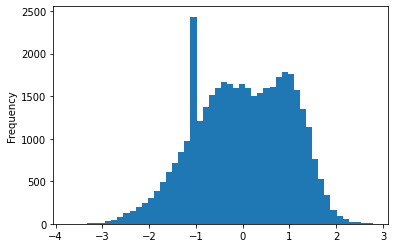

In [183]:
dft.min_mag_1.plot.hist(bins=50)

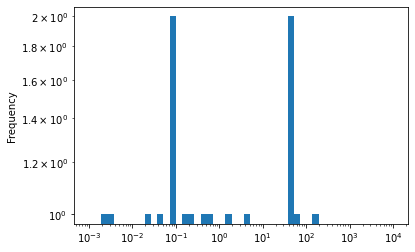

In [184]:
dft.MHPS_ratio_1.plot.hist(log=True, bins=np.logspace(-3, 4, 50))
plt.xscale('log')

## PowerTransform

Power transforms are a family of parametric, monotonic transformations that are applied to make data more Gaussian-like. This is useful for modeling issues related to heteroscedasticity (non-constant variance), or other situations where normality is desired.

Currently, PowerTransformer supports the Box-Cox transform and the Yeo-Johnson transform. The optimal parameter for stabilizing variance and minimizing skewness is estimated through maximum likelihood.

Box-Cox requires input data to be strictly positive, while Yeo-Johnson supports both positive or negative data.

By default, zero-mean, unit-variance normalization is applied to the transformed data.

Box-Cox

![BoxCox](boxcox.png)

Yeo-Johnson

![Yeo-Johnson](yeo-johnson.png)


![pt](powertransform.png)

![pt2](sklearn_powertransform.png)

In [185]:
from sklearn.preprocessing import PowerTransformer

In [186]:
power = PowerTransformer(method='yeo-johnson', standardize=True)

In [187]:
power.fit(dft)

PowerTransformer()

In [188]:
dftp = pd.DataFrame(data=power.transform(dft), columns=list(dft), index=dft.index)
dftp

,Amplitude_1,Amplitude_2,AndersonDarling_1,AndersonDarling_2,Autocor_length_1,Autocor_length_2,Beyond1Std_1,Beyond1Std_2,Con_1,Con_2,...,n_non_det_before_fid_1,n_non_det_before_fid_2,n_pos_1,n_pos_2,positive_fraction_1,positive_fraction_2,r-W2_0,r-W3_0,rb_0,sgscore1_0
oid,,,,,,,,,,,,,,,,,,,,,
ZTF17aaaabrg,-0.561922,-0.433047,0.640293,0.644703,-0.667632,-0.613206,0.961179,0.386130,-0.27796,-0.262906,...,-0.982340,-1.072492,0.137357,0.836009,-0.469210,-0.149017,-0.371651,-0.371521,0.890137,0.343785
ZTF17aaaabtj,-0.320594,-0.528500,0.640293,0.644703,-0.667632,-0.613206,1.556001,0.710863,-0.27796,3.805957,...,-0.982340,-0.688047,1.227352,-0.101178,-0.129422,-0.919187,-0.371651,-0.371521,0.497535,0.556082
ZTF17aaaacml,-0.889354,-0.866812,0.640293,0.644703,-0.667632,-0.613206,0.743625,-1.058194,-0.27796,-0.262906,...,-0.982340,-0.349336,0.024064,1.268559,-0.337647,0.916867,-0.371651,-0.371521,0.379037,0.780360
ZTF17aaaacnc,-0.780478,-0.530001,0.640293,0.644087,-0.667632,-0.613206,-2.913883,0.260172,-0.27796,-0.262906,...,0.846337,-0.053175,-1.088529,-0.602955,-1.119710,-0.837892,-0.371651,-0.371521,-0.696037,0.739853
ZTF17aaaacnt,0.827030,0.669366,0.640286,-1.631673,-0.667632,-0.613206,-0.911154,-0.307679,-0.27796,-0.262906,...,-0.462189,-0.688047,1.227352,1.592302,0.397254,0.614103,-0.371651,-0.371521,-0.879660,0.704863
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZTF21abkjyui,0.850358,-0.315948,-1.782891,0.644703,-0.667632,-0.613206,0.046396,0.076986,-0.27796,-0.262906,...,-0.982340,-1.072492,-0.663638,-1.107143,1.431195,-1.252397,-0.371651,-0.371521,-1.075617,0.341802
ZTF21abkndcw,0.717312,-0.315948,0.354218,0.644703,-0.667632,-0.613206,-1.737579,0.076986,-0.27796,-0.262906,...,-0.982340,-1.072492,-1.088529,-0.602955,-0.778463,1.414338,2.621271,2.691393,0.005266,-0.462056
ZTF21abknlix,-1.481744,-1.502829,-1.875908,-1.904138,1.270590,-0.613206,0.867206,-0.444767,-0.27796,-0.262906,...,-0.982340,-0.349336,-0.226164,-0.423639,1.431195,1.414338,2.719406,2.712137,-0.563765,0.811092


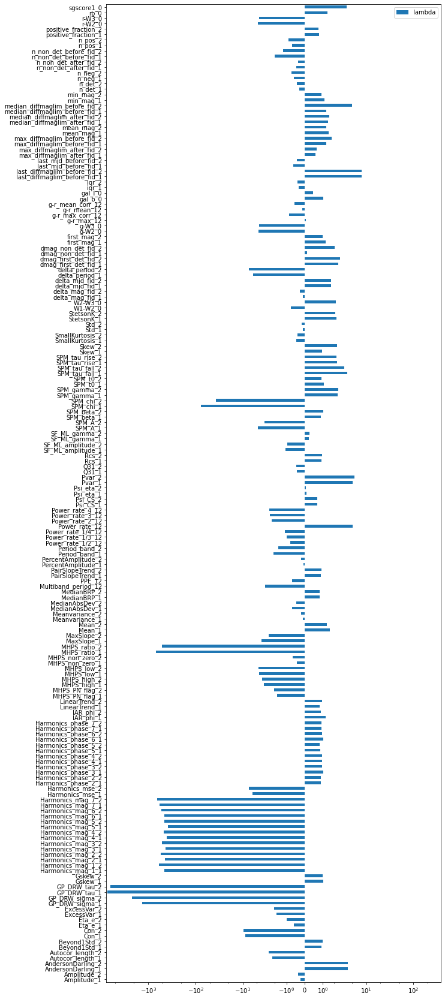

In [189]:
pd.DataFrame(data=power.lambdas_, columns=["lambda"], index=list(df)).plot.barh(figsize=(10, 30))
plt.xscale('asinh')

Let's look at one variable

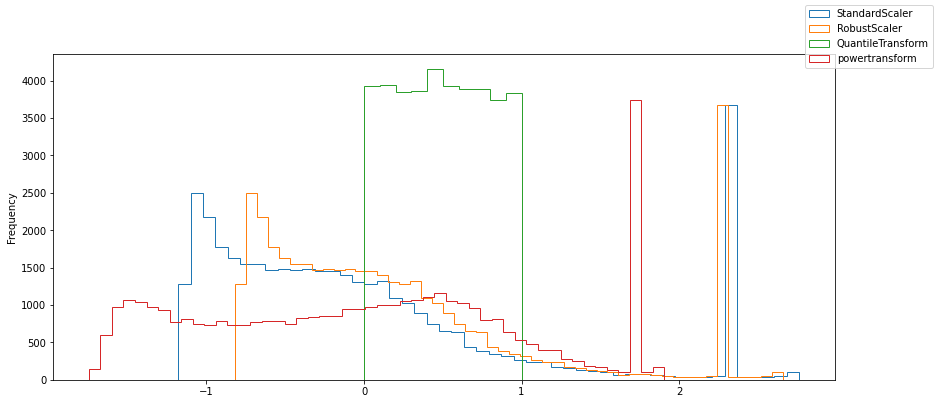

In [190]:
fig, ax = plt.subplots(figsize=(14, 6))
#df.min_mag_1.plot.hist(bins=50, ax=ax, label="original", alpha=0.7, )
var = 'Psi_eta_2'
dft[var].plot.hist(bins=50, ax=ax, label='StandardScaler', histtype='step')
dftr[var].plot.hist(bins=50, ax=ax, label='RobustScaler', histtype='step')
dftq[var].plot.hist(bins=10, ax=ax, label='QuantileTransform', histtype='step')
dftp[var].plot.hist(bins=50, ax=ax, label='powertransform', histtype='step')
fig.legend()

Let's repeat the normality tests

<Axes: >

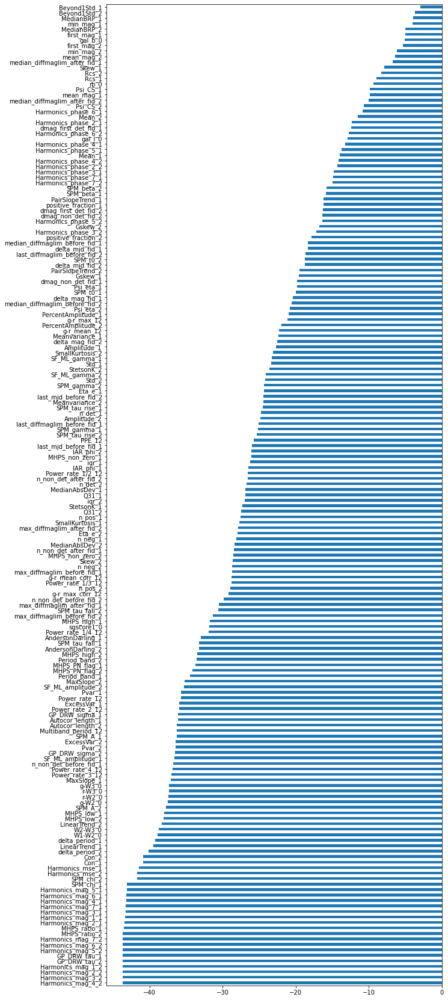

In [191]:
SWr = dftr.sample(500).apply(lambda col: np.log10(stats.shapiro(col.dropna()).pvalue), axis=0)
SWr.sort_values().plot.barh(figsize=(10, 30))

/home/fforster/anaconda3/lib/python3.8/site-packages/scipy/stats/_morestats.py:1813: UserWarning: Input data for shapiro has range zero. The results may not be accurate.
  warnings.warn("Input data for shapiro has range zero. The results "


<Axes: >

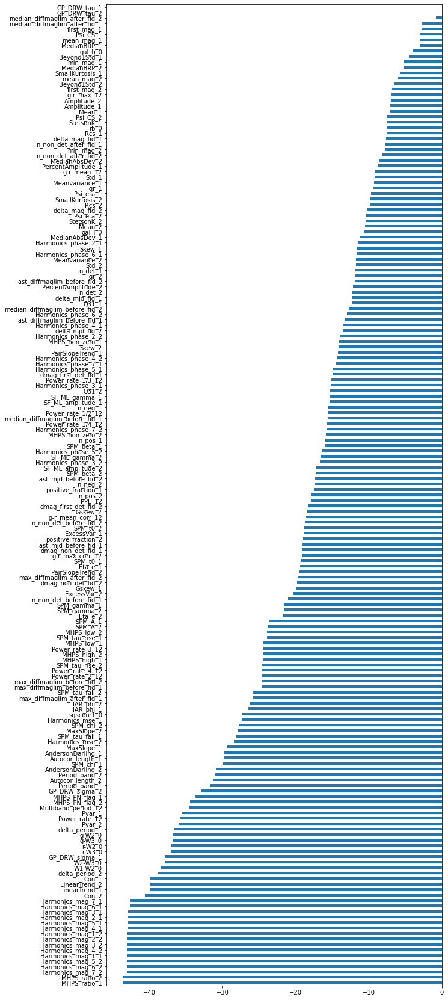

In [192]:
SWp = dftp.sample(500).apply(lambda col: np.log10(stats.shapiro(col.dropna()).pvalue), axis=0)
SWp.sort_values().plot.barh(figsize=(10, 30))

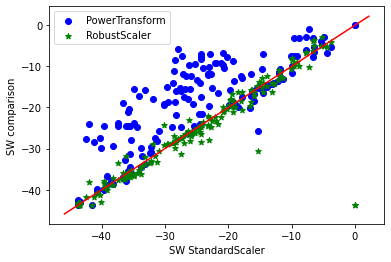

In [193]:
fig, ax = plt.subplots()
ax.scatter(SW, SWp, c='b', label='PowerTransform')
ax.scatter(SW, SWr, c='g', marker='*', label='RobustScaler')
ax.plot(ax.get_xlim(), ax.get_xlim(), c='r')
ax.set_xlabel("SW StandardScaler")
ax.set_ylabel("SW comparison")
ax.legend()

We can see that the PowerTransform is the best transformation making the variables distributed closer to a Gaussian(0, 1)

Let's look at the box plots again

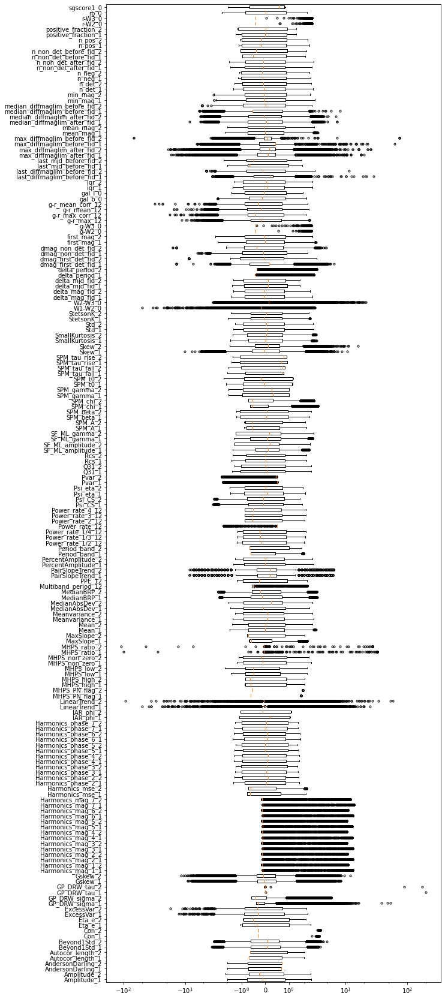

In [194]:
fig, ax = plt.subplots(figsize=(10, 30))
ax.boxplot(dftp.dropna(), vert=False, labels=list(df), flierprops={'marker':'.'})
ax.set_xscale('asinh', linthresh=0.1)

# Correlations

Now that the variables are more normally distributed, let's look at the correlations

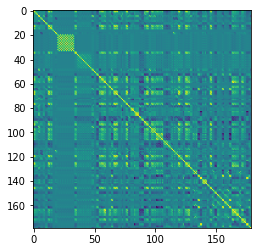

In [195]:
cm = dftp.corr() # if you use cov the covariance will not be normalized, try that as well
plt.imshow(cm)

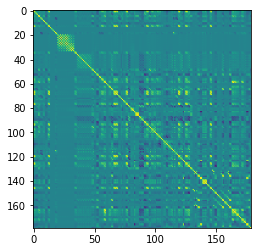

In [196]:
cm = dft.corr()
plt.imshow(cm)

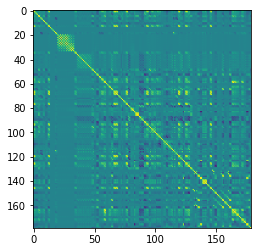

In [197]:
cm = dftr.corr()
plt.imshow(cm)

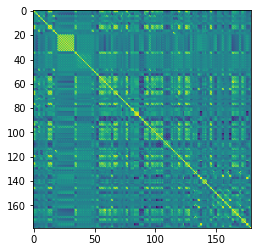

In [198]:
cm = dftq.corr()
plt.imshow(cm)

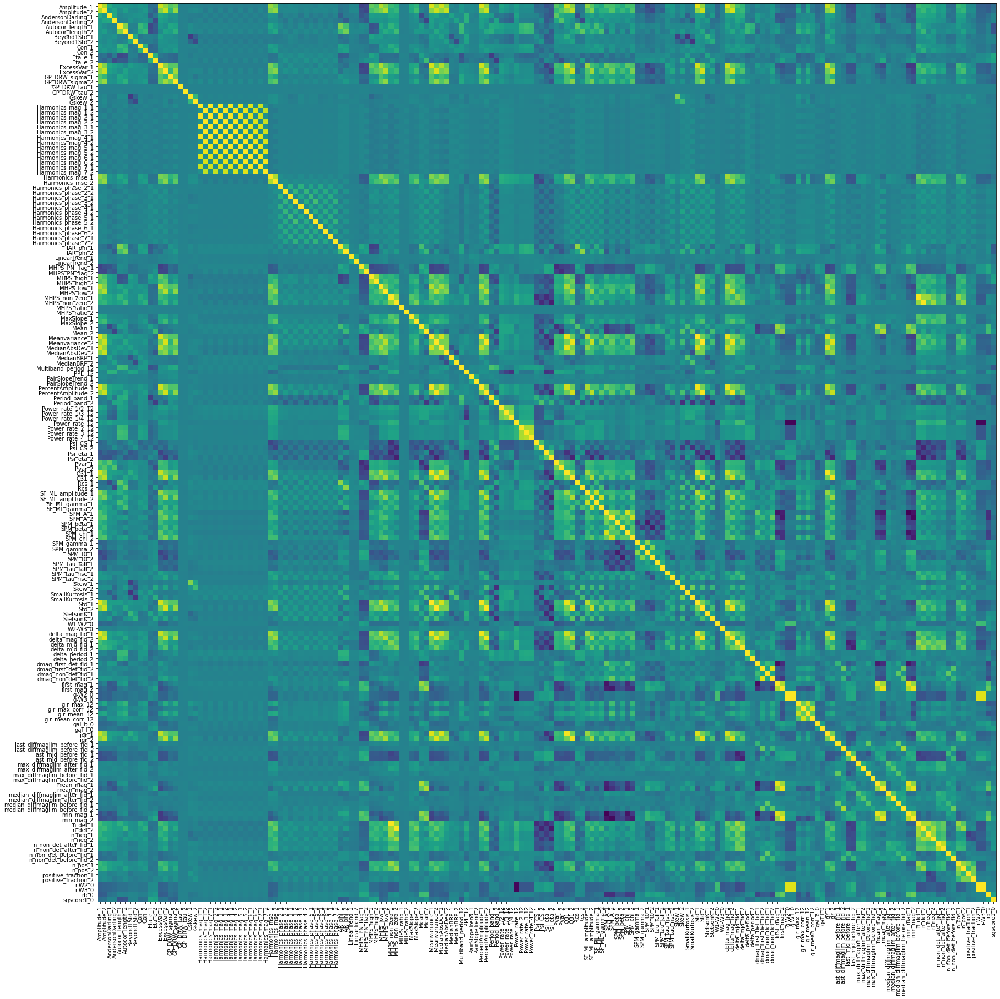

In [199]:
fig, ax = plt.subplots(figsize=(30, 30))
cm = dftp.corr()
ax.imshow(cm)
ax.set_yticks(range(dftp.shape[1]))
ax.set_yticklabels(list(dftp));
ax.set_xticks(range(dftp.shape[1]))
ax.set_xticklabels(list(dftp), rotation=90);

Let's sort this matrix. We will first define some distance between variables as 1-|corr|

In [200]:
distance_matrix = 1 - cm.abs()

Then we will use a hierarchical clustering algorithm to find groups 

In [201]:
import scipy.cluster.hierarchy as sch

In [202]:
linkage_matrix = sch.linkage(sch.distance.squareform(distance_matrix), method='complete')

In [203]:
# Reorder the correlation matrix according to the clustering
dendrogram = sch.dendrogram(linkage_matrix, no_plot=True)
index = dendrogram['leaves']
sorted_correlation_matrix = cm.iloc[index, :].iloc[:, index]

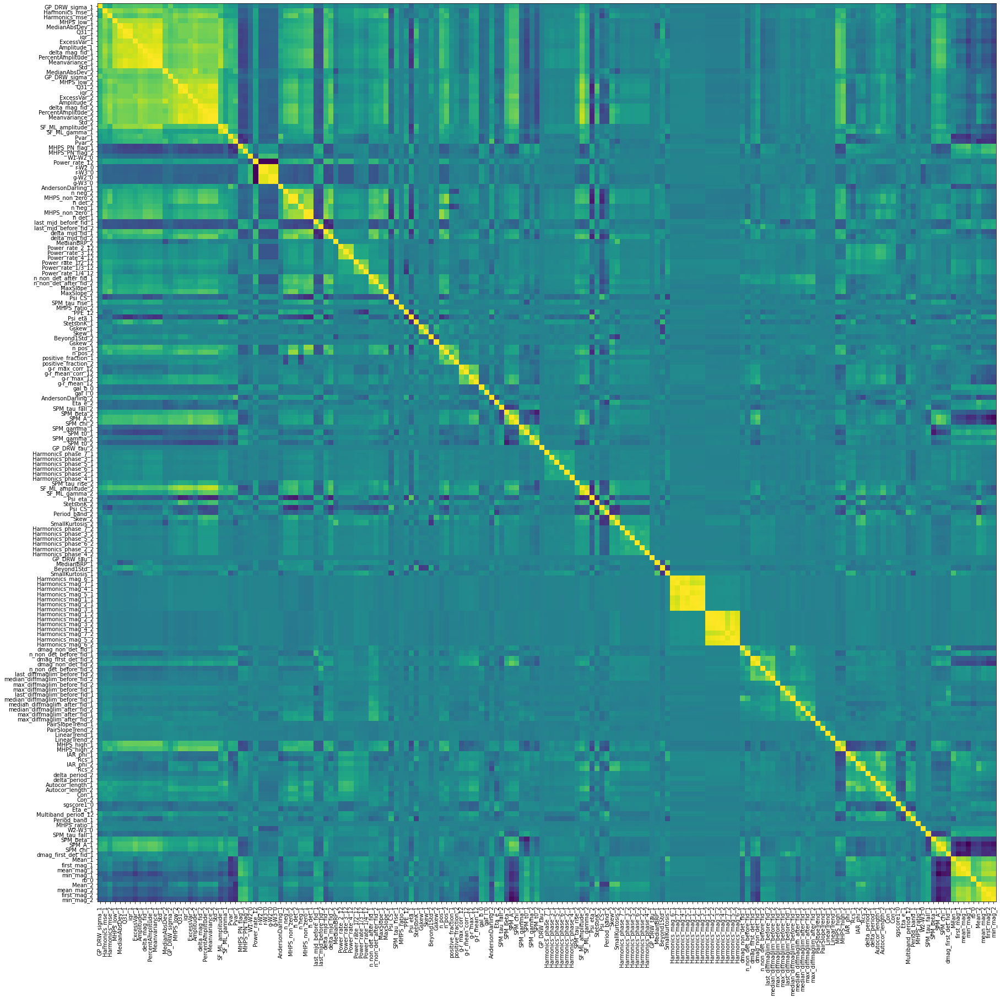

In [204]:
# Visualize the sorted correlation matrix
fig, ax = plt.subplots(figsize=(30, 30))
ax.imshow(sorted_correlation_matrix)
ax.set_yticks(range(dftp.shape[1]))
ax.set_yticklabels(np.array(list(dftp))[index]);
ax.set_xticks(range(dftp.shape[1]))
ax.set_xticklabels(np.array(list(dftp))[index], rotation=90);

## Beyond linear correlations: mutual information

Mutual Information (MI) is a measure of the amount of information obtained about one variable through another variable. It quantifies the dependency between two random variables. Unlike correlation, MI can capture both linear and non-linear relationships between variables.

Mathematically, for two discrete random variables X and Y, the Mutual Information is given by:

$\LARGE I(X;Y) = \sum_{x \in X} \sum_{y \in Y} P(x,y) \log\biggl(\frac{P(x, y)}{P(x) P(y)}\biggr)$

where P(x,y) is the joint probability distribution of X and Y, P(x) and P(y) are the marginal probability distributions of X and Y.


For continuous cases we can use:

$ \LARGE
I(X;Y) = \int_x \int_y p(x, y) \log \left( \frac{p(x, y)}{p(x) p(y)} \right) dx \, dy
$

where p(x, y) is the joint probability density function.

Mutual information is implemented in `mutual_info_score` in `sklearn.metrics` for discrete variables and in `mutual_info_regression` or `mutual_info_classif` for continuous variables.

See example from https://scikit-learn.org/stable/auto_examples/feature_selection/plot_f_test_vs_mi.html#sphx-glr-auto-examples-feature-selection-plot-f-test-vs-mi-py :

We consider 3 features $x_1$, $x_2$, $x_3$ distributed uniformly over [0, 1], the target depends on them as follows:

$\Large y = x_1 + sin(6 \pi  x_2) + 0.1  N(0, 1)$, that is the third feature is completely irrelevant.

The code below plots the dependency of y against individual x_i and normalized values of univariate F-tests statistics and mutual information.

As F-test captures only linear dependency, it rates x_1 as the most discriminative feature. On the other hand, mutual information can capture any kind of dependency between variables and it rates x_2 as the most discriminative feature, which probably agrees better with our intuitive perception for this example. Both methods correctly mark x_3 as irrelevant.

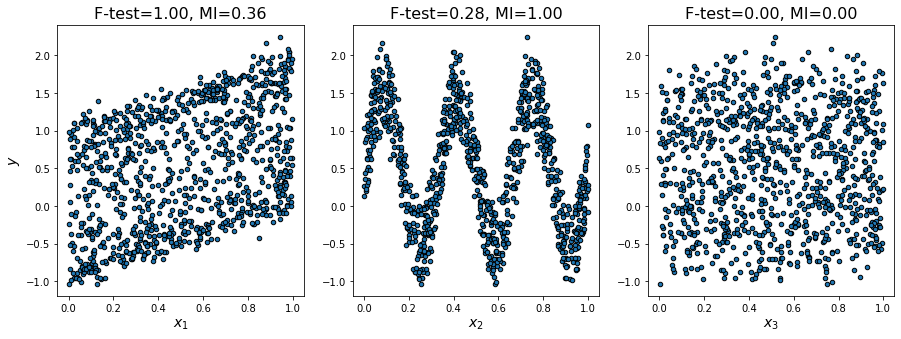

In [1]:
# Authors: The scikit-learn developers
# SPDX-License-Identifier: BSD-3-Clause

import matplotlib.pyplot as plt
import numpy as np

from sklearn.feature_selection import f_regression, mutual_info_regression

np.random.seed(0)
X = np.random.rand(1000, 3)
y = X[:, 0] + np.sin(6 * np.pi * X[:, 1]) + 0.1 * np.random.randn(1000)

f_test, _ = f_regression(X, y)
f_test /= np.max(f_test)

mi = mutual_info_regression(X, y)
mi /= np.max(mi)

plt.figure(figsize=(15, 5))
for i in range(3):
    plt.subplot(1, 3, i + 1)
    plt.scatter(X[:, i], y, edgecolor="black", s=20)
    plt.xlabel("$x_{}$".format(i + 1), fontsize=14)
    if i == 0:
        plt.ylabel("$y$", fontsize=14)
    plt.title("F-test={:.2f}, MI={:.2f}".format(f_test[i], mi[i]), fontsize=16)
plt.show()

# Data reduction

* Dimensionality reduction
* Numerosity reduction
* Data compression
* Changing the data representation

## Dimensionality reduction

Let's get the labels for our dataset so that we can visualize how well our variables are separated

In [205]:
labels = pd.read_pickle("data/dfcrossmatches_small.pickle")

In [206]:
labels

,classALeRCE,ra,dec,period,source,id_source,class_source,separation_arcsec
oid,,,,,,,,
ZTF18aaveffj,LPV,291.520423,21.930962,NaN,GAIADR2VS,2018953972876187648.0,MIRA_SR,0.067312
ZTF19aauyvnv,LPV,270.298238,-17.722810,NaN,GAIADR2VS,4143774487177066496.0,MIRA_SR,0.062104
ZTF18ablqvvc,RRL,271.180157,-6.556286,NaN,GAIADR2VS,4171403011041441792.0,RRAB,0.095138
ZTF19abiblfd,RRL,268.188213,-17.161156,NaN,GAIADR2VS,4144758786310249984.0,RRAB,0.043913
ZTF18acbvvku,AGN,48.110790,39.274936,NaN,MILLIQUAS,4C 39.11,A,0.055433
...,...,...,...,...,...,...,...,...
ZTF18aawgtde,QSO,235.612689,29.700747,NaN,MILLIQUAS,FBQS J1542+2942,Q,0.384536
ZTF18ablqnie,LPV,260.850159,-23.237702,NaN,GAIADR2VS,4111611813625888768.0,MIRA_SR,0.228594
ZTF19adcftsl,QSO,210.322714,22.715302,NaN,MILLIQUAS,LAMOSTJ140117.45+224255.2,Q,0.067727


In [207]:
labels = labels.loc[labels.index.isin(df.index)].classALeRCE

In [208]:
labels.unique()

array(['LPV', 'RRL', 'AGN', 'QSO', 'EB/EW', 'YSO', 'NLQSO', 'EA',
       'Blazar', 'RSCVn', 'DSCT', 'Ceph', 'SNIa', 'SLSN', 'CV/Nova',
       'SNII', 'Periodic-Other', 'SNIbc', 'SNIIn', 'SNIIb', 'TDE',
       'NLAGN'], dtype=object)

We will drop two labels that are not relevant based on domain knowledge

In [209]:
mask = labels.isin(['LPV', 'RRL', 'AGN', 'QSO', 'EB/EW', 'YSO', 'EA',
       'Blazar', 'RSCVn', 'DSCT', 'Ceph', 'SNIa', 'SLSN', 'CV/Nova',
       'SNII', 'Periodic-Other', 'SNIbc', 'SNIIn', 'SNIIb', 'TDE'])

In [210]:
dftp = dftp.loc[mask]
labels = labels.loc[dftp.index]

In [211]:
dftp.shape

(38983, 179)

In [212]:
df.head()

,Amplitude_1,Amplitude_2,AndersonDarling_1,AndersonDarling_2,Autocor_length_1,Autocor_length_2,Beyond1Std_1,Beyond1Std_2,Con_1,Con_2,...,n_non_det_before_fid_1,n_non_det_before_fid_2,n_pos_1,n_pos_2,positive_fraction_1,positive_fraction_2,r-W2_0,r-W3_0,rb_0,sgscore1_0
oid,,,,,,,,,,,,,,,,,,,,,
ZTF17aaaabrg,0.242504,0.232499,1.0,1.000000,1.0,1.0,0.426471,0.361446,0.0,0.000000,...,0.0,0.0,18.0,29.0,0.264706,0.349398,0.193442,0.429442,0.891429,0.979470
ZTF17aaaabtj,0.294114,0.216206,1.0,1.000000,1.0,1.0,0.489510,0.390909,0.0,0.009259,...,0.0,1.0,54.0,11.0,0.377622,0.100000,0.193442,0.429442,0.864286,0.989226
ZTF17aaaacml,0.179008,0.162632,1.0,1.000000,1.0,1.0,0.403846,0.229508,0.0,0.000000,...,0.0,2.0,16.0,47.0,0.307692,0.770492,0.193442,0.429442,0.855714,0.998750
ZTF17aaaacnc,0.199403,0.215955,1.0,0.999978,1.0,1.0,0.062500,0.350000,0.0,0.000000,...,5.0,3.0,1.0,5.0,0.062500,0.125000,0.193442,0.429442,0.764286,0.997083
ZTF17aaaacnt,0.671062,0.498549,1.0,0.775576,1.0,1.0,0.242105,0.298246,0.0,0.000000,...,1.0,1.0,54.0,73.0,0.568421,0.640351,0.193442,0.429442,0.745714,0.995625


In [213]:
labels[:5]

oid
ZTF17aaaabrg    EB/EW
ZTF17aaaabtj      RRL
ZTF17aaaacml    EB/EW
ZTF17aaaacnc    RSCVn
ZTF17aaaacnt    EB/EW
Name: classALeRCE, dtype: object

<Axes: >

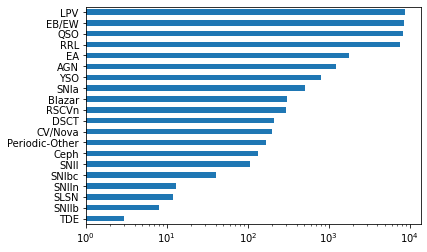

In [214]:
labels.value_counts().sort_values().plot.barh(log=True)

The data is highly imbalanced!

Let's encode the labels
https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.LabelEncoder.html

In [215]:
from sklearn import preprocessing
le = preprocessing.LabelEncoder()
le.fit(['SNIbc', 'SNII', 'SNIIn', 'SNIIb', 'SNIa', 'SLSN', 'TDE',
       'CV/Nova', 'AGN', 'QSO', 'Blazar', 'YSO', 
       'DSCT', 'RRL','EB/EW', 'EA', 'Ceph', 'LPV', 'RSCVn', 'Periodic-Other'])
# force given order
le.classes_ = np.array(['SNIbc', 'SNII', 'SNIIn', 'SNIIb', 'SNIa', 'SLSN', 'TDE',
       'CV/Nova', 'AGN', 'QSO', 'Blazar', 'YSO', 
       'DSCT', 'RRL','EB/EW', 'EA', 'Ceph', 'LPV', 'RSCVn', 'Periodic-Other'])
y = le.transform(labels)

In [216]:
le.inverse_transform([y[0]])

array(['EB/EW'], dtype='<U14')

We will try using PCA, t-SNe, UMAP and PACMAP

### PCA

In [121]:
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
pca.fit(dftp)
df_pca = pca.transform(dftp)

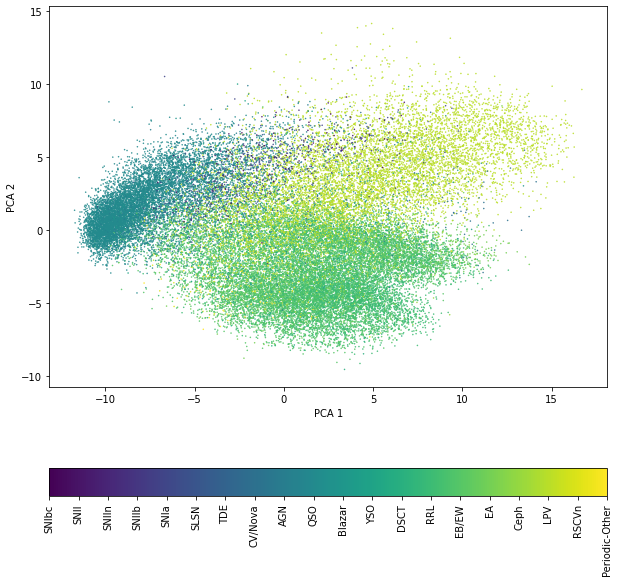

In [122]:
fig, ax = plt.subplots(figsize = (10, 10), sharex = True)
cax = ax.scatter(df_pca[:, 0], df_pca[:, 1], c=np.array(y), marker='.', s=1)
ax.set_xlabel("PCA 1")
ax.set_ylabel("PCA 2")
cbar = plt.colorbar(cax, orientation='horizontal')
cbar.ax.set_xticks(np.array(range(y.max()+1)), 
                   labels=[le.inverse_transform([i])[0] for i in (np.array(range(y.max()+1)))])
cbar.ax.set_xticklabels(cbar.ax.get_xticklabels(), rotation=90);

### t-SNE

In [123]:
from sklearn.manifold import TSNE

In [124]:
tsne_model = TSNE(n_components = 2, init = 'pca', perplexity = 25)
df_tsne = tsne_model.fit_transform(dftp[:10000])

Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7fbc053a4b80>
Traceback (most recent call last):
  File "/home/fforster/anaconda3/lib/python3.8/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/home/fforster/anaconda3/lib/python3.8/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
  File "/home/fforster/anaconda3/lib/python3.8/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
  File "/home/fforster/anaconda3/lib/python3.8/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
AttributeError: 'NoneType' object has no attribute 'split'


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


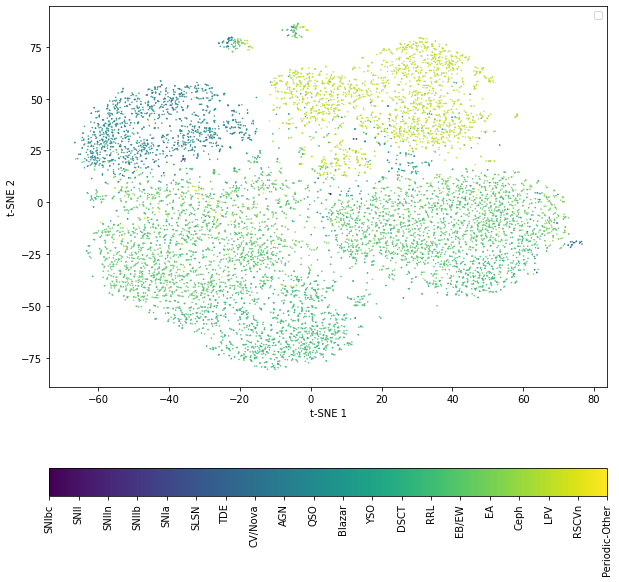

In [125]:
fig, ax = plt.subplots(figsize = (10, 10), sharex = True)
cax = ax.scatter(df_tsne[:, 0], df_tsne[:, 1], c=np.array(y[:10000]), marker='.', s=1)
ax.set_xlabel("t-SNE 1")
ax.set_ylabel("t-SNE 2")
ax.legend();
cbar = plt.colorbar(cax, orientation='horizontal')
cbar.ax.set_xticks(np.array(range(y.max()+1)), 
                   labels=[le.inverse_transform([i])[0] for i in (np.array(range(y.max()+1)))])
cbar.ax.set_xticklabels(cbar.ax.get_xticklabels(), rotation=90);

### UMAP

In [126]:
import umap
reducer = umap.UMAP()

In [127]:
df_umap = reducer.fit_transform(dftp)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


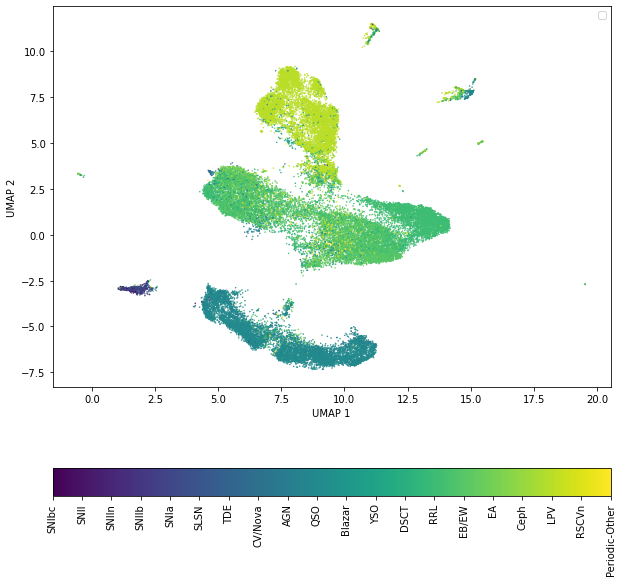

In [128]:
fig, ax = plt.subplots(figsize = (10, 10), sharex = True)
cax = ax.scatter(df_umap[:, 0], df_umap[:, 1], c=y, marker='.', s=1)
ax.set_xlabel("UMAP 1")
ax.set_ylabel("UMAP 2")
ax.legend();
cbar = plt.colorbar(cax, orientation='horizontal')
cbar.ax.set_xticks(np.array(range(y.max()+1)), 
                   labels=[le.inverse_transform([i])[0] for i in (np.array(range(y.max()+1)))])
cbar.ax.set_xticklabels(cbar.ax.get_xticklabels(), rotation=90);

### PacMAP

In [129]:
import pacmap

In [130]:
embedding = pacmap.PaCMAP(n_dims=2, n_neighbors=None, MN_ratio=0.5, FP_ratio=4.0)
df_pacmap = embedding.fit_transform(dftp, init="pca")

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


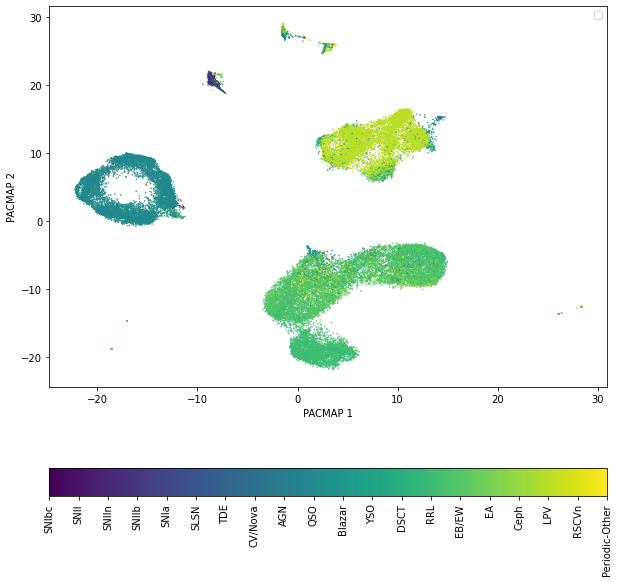

In [131]:
fig, ax = plt.subplots(figsize = (10, 10), sharex = True)
cax = ax.scatter(df_pacmap[:, 0], df_pacmap[:, 1], c=y, marker = ".", s=1)
ax.set_xlabel("PACMAP 1")
ax.set_ylabel("PACMAP 2")
ax.legend();
cbar = plt.colorbar(cax, orientation='horizontal')
cbar.ax.set_xticks(np.array(range(y.max() + 1)), 
                   labels=[le.inverse_transform([i])[0] for i in (np.array(range(y.max() + 1)))])
cbar.ax.set_xticklabels(cbar.ax.get_xticklabels(), rotation=90)
plt.show()

## Compute feature importance using random forest classifier

In [132]:
from imblearn.ensemble import BalancedRandomForestClassifier

In [133]:
forest = BalancedRandomForestClassifier()
forest.fit(dftp, labels)

/home/fforster/anaconda3/lib/python3.8/site-packages/imblearn/ensemble/_forest.py:577: FutureWarning: The default of `sampling_strategy` will change from `'auto'` to `'all'` in version 0.13. This change will follow the implementation proposed in the original paper. Set to `'all'` to silence this warning and adopt the future behaviour.
  warn(
/home/fforster/anaconda3/lib/python3.8/site-packages/imblearn/ensemble/_forest.py:589: FutureWarning: The default of `replacement` will change from `False` to `True` in version 0.13. This change will follow the implementation proposed in the original paper. Set to `True` to silence this warning and adopt the future behaviour.
  warn(
/home/fforster/anaconda3/lib/python3.8/site-packages/imblearn/ensemble/_forest.py:601: FutureWarning: The default of `bootstrap` will change from `True` to `False` in version 0.13. This change will follow the implementation proposed in the original paper. Set to `False` to silence this warning and adopt the future beh

BalancedRandomForestClassifier()

<Axes: >

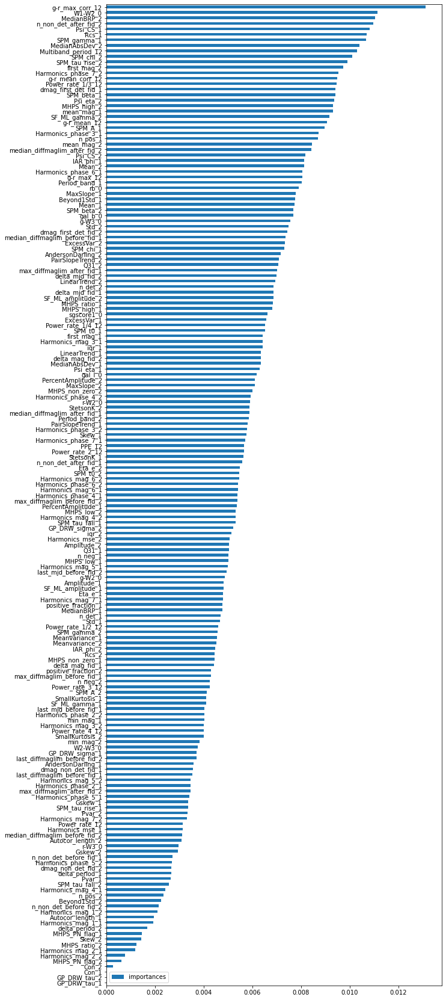

In [134]:
importances = forest.feature_importances_
std = np.std([tree.feature_importances_ for tree in forest.estimators_], axis=0)
imps = pd.DataFrame.from_dict({"importances": importances})
imps.index = list(dftp)
imps.sort_values(by="importances").plot.barh(figsize=(10, 30))

# Summary

* Automatic EDA
* Basic statistics
* Missing data imputation
* normality tests and data transformation
* correlations and variable clustering
* dimensionality reduction
* class distribution if labels exist
* a lot more can be done!

Some comments:

* if you are imputing data, it would be better to impute it after doing any transformations. In that way the correlations will be more useful.
* also, if you are working in a supervised setting, learn transformations based on the training set alone. Otherwise there could be some information leakege. 